In [4]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow_datasets as tfds
import tensorflow as tf



(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)


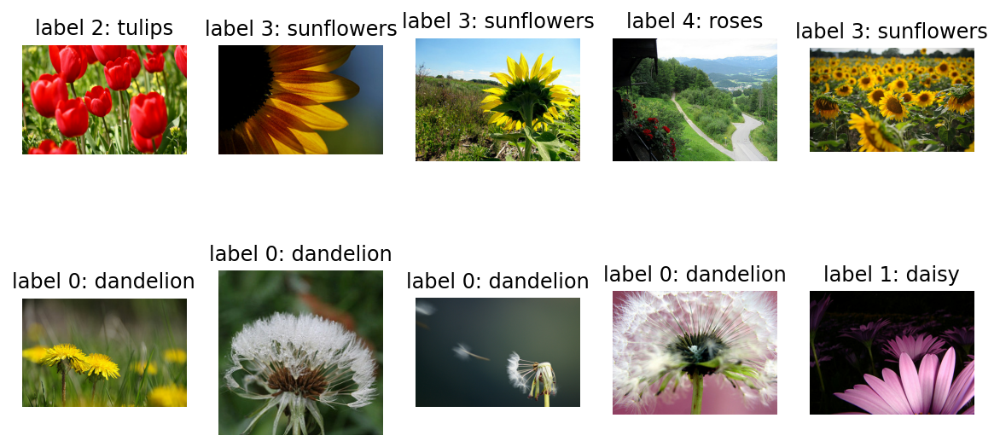

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#raw_train 안에 있는 데이터 확인해보기

plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [7]:
#이미지 사이즈 변환

IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

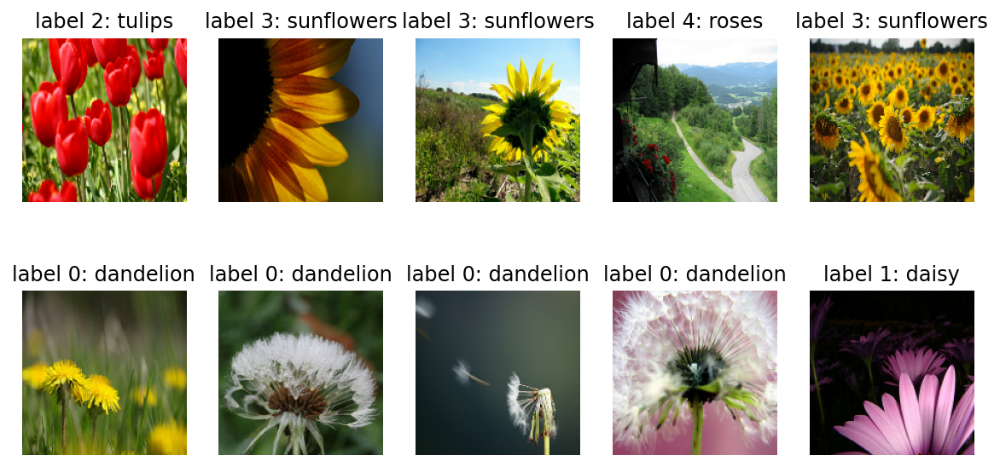

In [8]:
#다시 사이즈가 잘 바뀌었나 확인해보기

plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [17]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

#CNN 모델 구현 - 'Flowers' 의 Class 가 5개 이므로 Dense - units 를 5로

model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])


model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25600)            

In [10]:
#배열을 다루기 용이한 numpy 를 활용하여 이해해보기

import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

image.flatten()

(2, 2)


array([1, 2, 3, 4])

In [19]:
#모델 compile 완료 후 학습시켜보기

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

#BATCH_SIZE = 한스텝에 학습시킬 데이터의 개수
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

#32개의 데이터를 랜덤으로 뿌려줄 train_batches, validation_batches, test_batches 생성

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

#train_batches 중 하나의 batch 만 꺼내서 확인해보기

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape


(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [20]:
#초기모델의 성능 알아보기

validation_steps = 10
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))


10/10 [==============================] - 0s 12ms/step - loss: 1.6412 - accuracy: 0.1750
initial loss: 1.64
initial accuracy: 0.17


In [21]:
# 10 epoch 를 학습시켜 정확도가 어떻게 변하는지 보기

EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 2s 26ms/step - loss: 1.4084 - accuracy: 0.4074 - val_loss: 1.2526 - val_accuracy: 0.4523
Epoch 2/10
92/92 [==============================] - 2s 26ms/step - loss: 1.1085 - accuracy: 0.5528 - val_loss: 1.1216 - val_accuracy: 0.5286
Epoch 3/10
92/92 [==============================] - 2s 26ms/step - loss: 0.9454 - accuracy: 0.6458 - val_loss: 1.0390 - val_accuracy: 0.5940
Epoch 4/10
92/92 [==============================] - 2s 26ms/step - loss: 0.8239 - accuracy: 0.6972 - val_loss: 0.9954 - val_accuracy: 0.5886
Epoch 5/10
92/92 [==============================] - 2s 26ms/step - loss: 0.7222 - accuracy: 0.7350 - val_loss: 0.9156 - val_accuracy: 0.6512
Epoch 6/10
92/92 [==============================] - 2s 26ms/step - loss: 0.6342 - accuracy: 0.7738 - val_loss: 0.9679 - val_accuracy: 0.6431
Epoch 7/10
92/92 [==============================] - 2s 26ms/step - loss: 0.5522 - accuracy: 0.8079 - val_loss: 0.9007 - val_accuracy: 0.6594
Epoch 8/10
92

In [22]:
#모델의 예측결과를 확인해보자

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[5.02388319e-03, 7.81513576e-04, 5.25450349e-01, 1.48295358e-01,
        3.20448905e-01],
       [8.11793983e-01, 1.84382096e-01, 2.93892133e-03, 8.52029043e-05,
        7.99748464e-04],
       [6.22581363e-01, 1.76569857e-02, 7.76643157e-02, 2.81105071e-01,
        9.92298475e-04],
       [9.89711732e-02, 7.17973351e-01, 1.23999991e-01, 1.24041112e-02,
        4.66513596e-02],
       [8.54366422e-01, 6.42950013e-02, 2.55090650e-02, 8.75438657e-03,
        4.70751263e-02],
       [8.06068406e-02, 2.59355128e-01, 7.71885812e-02, 7.45235384e-03,
        5.75397074e-01],
       [6.67157443e-03, 2.32534945e-01, 7.18832076e-01, 1.44977439e-02,
        2.74637248e-02],
       [1.06503218e-01, 2.50224441e-01, 1.11468099e-01, 2.23281421e-02,
        5.09476125e-01],
       [1.88015029e-02, 7.92460996e-05, 8.90610367e-03, 9.72036958e-01,
        1.76247951e-04],
       [9.89657462e-01, 8.42639524e-03, 4.59210132e-04, 9.68142631e-05,
        1.36015483e-03],
       [9.82130229e-01, 4.9323

In [23]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 1, 0, 4, 2, 4, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 1, 1, 2, 0,
       1, 0, 1, 0, 4, 3, 2, 1, 0, 0])

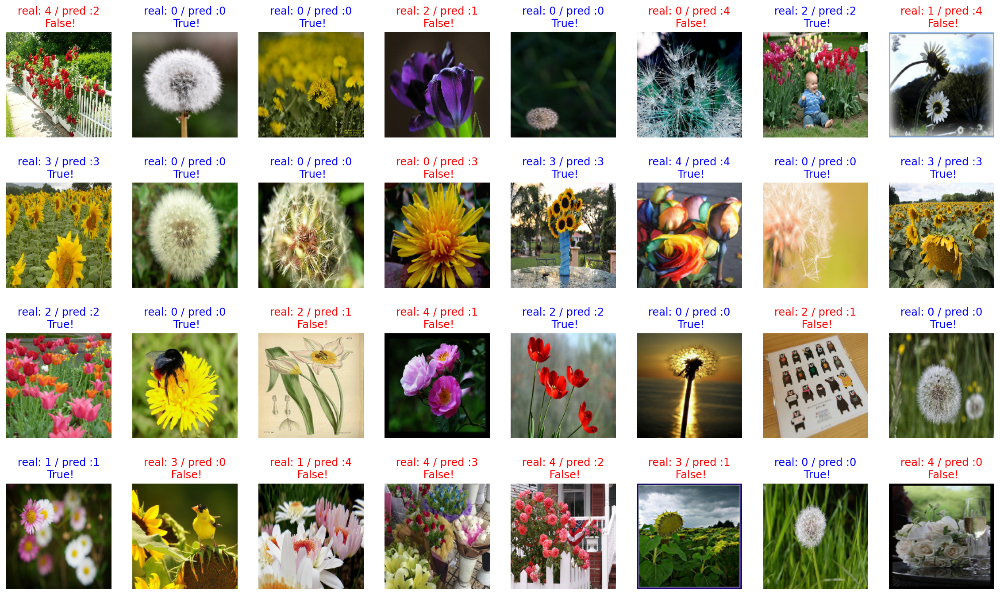

In [24]:
#32장의 images, 32개의 labels, 그리고 32개의 prediction 얻었으니 각각 시각화 해보기

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [25]:
#이미 학습된 모델 가져오기. 이미지를 입력받으면 해당이미지의 특징을 쏙쏙 잘 뽑아낸
#특징 벡터를 추출해낼수 있다.

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')


In [26]:
#실제로 모델에 이미지 데이터가 들어가면 어떻게 될지

image_batch.shape

TensorShape([32, 160, 160, 3])

In [29]:
feature_batch = base_model(image_batch)
feature_batch.shape

#이미지 개수는 여전히 32 장이지만, 사이즈가 작아졌고, 채널이 512로 늘어남

TensorShape([32, 5, 5, 512])

In [30]:
#Global Average Pooling 계층을 만들기

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()  

#VGG16이 출력했던 feature_batch 를 입력하면?

feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)


(32, 512)


In [55]:
#마지막으로 Dense 레이어들을 붙여주면 Classifier 완성

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

base_model.summary()


(32, 5)
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)     

In [81]:
# VGG16 에 해당하는 base_model 은 학습을 시키지 않을 예정이니 False 로 꺼주기
#base_model.trainable = False

####2번 전략을 선택하였습니다####

#base_model.trainable = False Classifier 만 학습시킬때
base_model.trainable = True
#N_Freeze 번까지는 학습 안시키고, 그 뒤에는 학습시키기
N_FREEZE = 70
for layer in base_model.layers[:N_FREEZE]:
    layer.trainable = False

#최종 모델 만들기

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

#모델 구조

model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [82]:
#모델을 Compile (전 과정과 동일)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

validation_steps= 12
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 1s 54ms/step - loss: 0.3860 - accuracy: 0.8501
initial loss: 0.39
initial accuracy: 0.85


In [83]:
#모델 학습

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 7s 76ms/step - loss: 0.3023 - accuracy: 0.8856 - val_loss: 0.3806 - val_accuracy: 0.8610
Epoch 2/5
92/92 [==============================] - 7s 74ms/step - loss: 0.2978 - accuracy: 0.8879 - val_loss: 0.3830 - val_accuracy: 0.8610
Epoch 3/5
92/92 [==============================] - 7s 74ms/step - loss: 0.2944 - accuracy: 0.8917 - val_loss: 0.3830 - val_accuracy: 0.8529
Epoch 4/5
92/92 [==============================] - 7s 74ms/step - loss: 0.2913 - accuracy: 0.8927 - val_loss: 0.3798 - val_accuracy: 0.8583
Epoch 5/5
92/92 [==============================] - 7s 74ms/step - loss: 0.2883 - accuracy: 0.8951 - val_loss: 0.3820 - val_accuracy: 0.8583


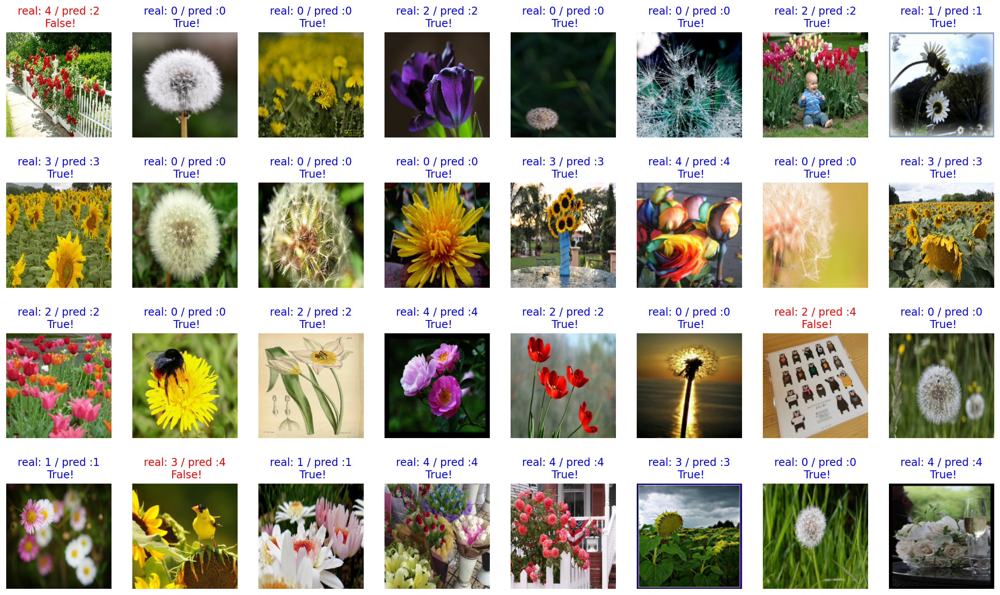

In [78]:
#32 개의 test sample 에 대한 예측 결과 또한 눈으로 보기

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

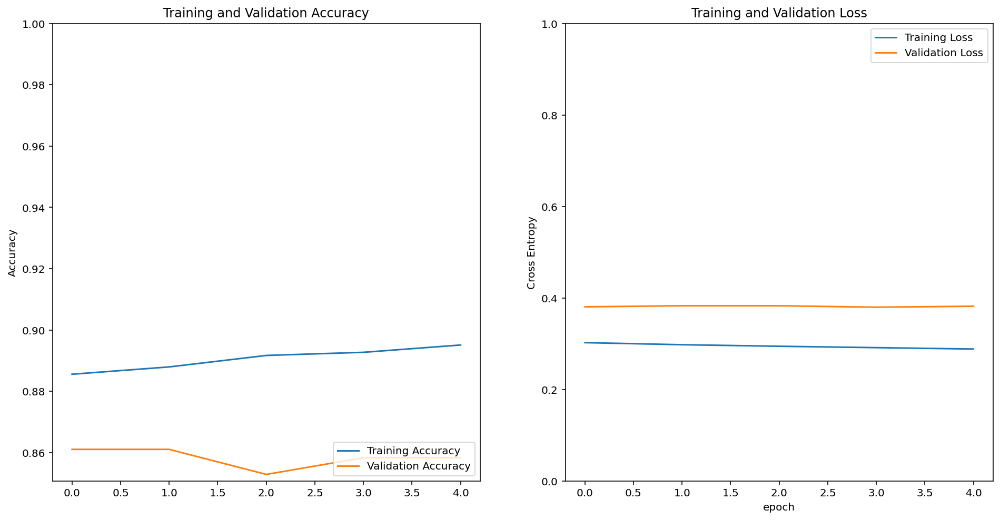

In [84]:
#학습 결과 그래프로 표현

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

기존의 CNN 모델을 사용하였을땐, DENSE 안의 Class 수를 5개로 늘려줬음에도 불구하고 Epoch 10 기준 정확도가 65% 나왔습니다.
하지만 VGG16 모델을 사용하고, DENSE 안의 Class 수 또한 5개로 바꿔주었더니 정확도가 80% 정도로 상승하였습니다.

전략은 2번 전략을 선택하였습니다. 이유는 CNN의 레이어중 초반부에 있는 레이어들은 기초적인 부분만 다루기때문에 FREEZE 를 이용해 작동을
멈추게하고 결국 실질적인 '꽃' 이라는 것을 판별하는 후반부를 더 돌리도록 설정하였습니다. Model 을 Summary 해서 어디서 freeze 할지를 정한뒤 (저같은 경우엔 70) compile 을 해준뒤 다시 학습을 시키니 정확도가 85% 로 상승하였습니다.